In [1]:
### TODO : Multy device use
# Trajectory probability by color

In [1]:
import torch
import numpy as np

print(f'Cuda available: {torch.cuda.is_available()}')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Running on: {device}, Device count: {torch.cuda.device_count()}')

Cuda available: True
Running on: cuda, Device count: 2


### Init dataset

In [2]:
from nuscenes import NuScenes
from custom_prediction.helper import PredictHelper

In [3]:
DATAROOT = 'D:/ThesisProjects/nuScenes_dataset/'

nusc = NuScenes('v1.0-trainval', dataroot=DATAROOT, verbose=False)
helper = PredictHelper(nusc)

In [4]:
from nuscenes.eval.prediction.splits import get_prediction_challenge_split

train = get_prediction_challenge_split("train", dataroot=DATAROOT)
valid = get_prediction_challenge_split("train_val", dataroot=DATAROOT)
test = get_prediction_challenge_split("val", dataroot=DATAROOT)

#### Check one of the samples

In [5]:
history_length = 2
prediction_length = 6

In [6]:
indx = 660 # 4620
instance_token, sample_token = train[indx].split("_")

#### Scene visualization

In [7]:
# my_sample = nusc.get('sample', sample_token)
# nusc.render_sample(sample_token)

#### Visualization as BEV

#### Check BEV representation

In [1374]:
# Reimport all needed libraries
import importlib
import custom_prediction.custom_input_representation.interface
import custom_prediction.custom_input_representation.agents
import custom_prediction.helper
import custom_prediction.custom_input_representation.static_layers

importlib.reload(custom_prediction.custom_input_representation.interface)
importlib.reload(custom_prediction.custom_input_representation.agents)
importlib.reload(custom_prediction.helper)
importlib.reload(custom_prediction.custom_input_representation.static_layers)

<module 'custom_prediction.custom_input_representation.static_layers' from 'D:\\ThesisProjects\\Raster-traffic-motion-prediction\\custom_prediction\\custom_input_representation\\static_layers.py'>

In [1375]:
from custom_prediction.custom_input_representation.static_layers import StaticLayerRasterizer
from custom_prediction.custom_input_representation.agents import AgentBoxesWithFadedHistory, AgentBoxesWithFutureTrajectory
from custom_prediction.custom_input_representation.interface import InputRepresentation
from custom_prediction.custom_input_representation.combinators import Rasterizer

from typing import Dict

# Bird-eye for input representation
input_static_layer_rasterizer = StaticLayerRasterizer(helper)
input_agent_rasterizer = AgentBoxesWithFadedHistory(helper, seconds_of_history=1)

input_representation = InputRepresentation(input_static_layer_rasterizer, input_agent_rasterizer, Rasterizer())

# Bird-eye visualization
static_colors = [[255, 255, 255], [136, 136, 136], [64, 64, 64]]

static_layer_rasterizer = StaticLayerRasterizer(helper, colorful_lines=False, colors=static_colors) #, meters_ahead=60, meters_left=30, meters_right=30, meters_behind=50, lanes_in_radius=80)
agent_rasterizer = AgentBoxesWithFutureTrajectory(helper, seconds_of_history=0) # meters_ahead=60, meters_left=30, meters_right=30, meters_behind=50)

vizualization_representation = InputRepresentation(static_layer_rasterizer, agent_rasterizer, Rasterizer())

In [1376]:
def generate_input_representation(instance_token, sample_token):
    img = input_representation.make_input_representation(instance_token, sample_token)
    #img = img / 255
    return img

# For debugging; with visualized predictions
def generate_scene_visualization(instance_token, sample_token, trajectory_predictions:Dict[str, np.ndarray]):
    img = vizualization_representation.make_input_representation(instance_token, sample_token, trajectory_predictions)

    return img

In [1377]:
random_instance_token_on_sample = helper.get_annotations_for_sample(sample_token)[8]['instance_token']

trajectory_predictions = helper.get_future_for_agent(random_instance_token_on_sample, sample_token, seconds=6, in_agent_frame=True)
trajectory_predictions = [trajectory_predictions * 2]

trajectories_with_probability = list(zip(trajectory_predictions, [0.15]))

all_prediction_dict = {instance_token: trajectories_with_probability}
all_prediction_dict

{'dde8b80e85dd4e83975f23f3ed216910': [(array([[-0.03318681,  1.50830456],
          [-0.06637362,  3.01660911],
          [ 0.0585285 ,  4.51472108],
          [ 0.13269101,  6.0170153 ],
          [ 0.24913653,  7.51582431],
          [ 0.36428879,  9.01615892],
          [ 0.48073431, 10.51496793],
          [ 0.59717983, 12.01377694],
          [ 0.71362535, 13.51258594]]),
   0.15)]}

In [1378]:
import matplotlib.pyplot as plt

def show_img(img, size=4):
    plt.figure(figsize=(size, size))
    plt.axis('off')
    plt.imshow(img)
    plt.show()

Gen time: 0.402 sec; shape: (500, 500, 3)


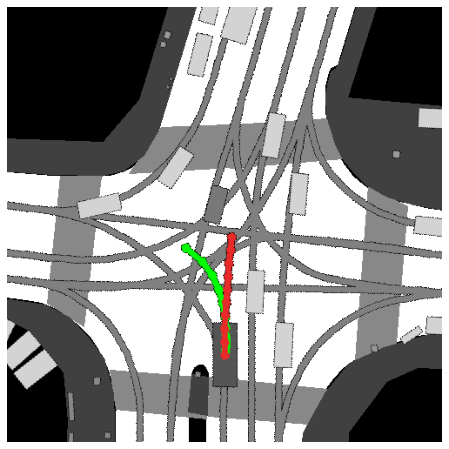

In [1379]:
import time

start_time = time.time()

img = generate_scene_visualization(instance_token, sample_token, all_prediction_dict)
print(f'Gen time: {round(time.time() - start_time, 3)} sec; shape: {img.shape}')

show_img(img, 8)

Gen time: 0.611 sec; shape: (500, 500, 3)


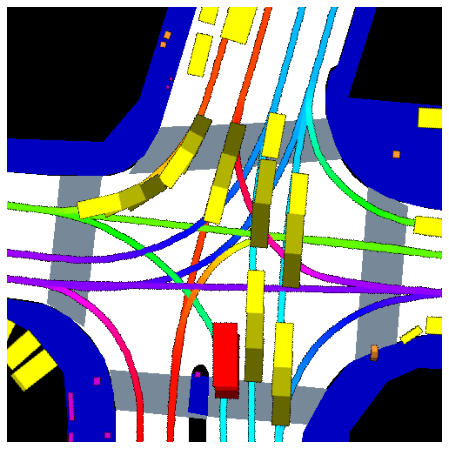

In [1381]:
start_time = time.time()

img = generate_input_representation(instance_token, sample_token)
print(f'Gen time: {round(time.time() - start_time, 3)} sec; shape: {img.shape}')

show_img(img, 8)

In [1407]:
import colorsys

def draw_prediction_on_canvas(future, predict_trajectories=[], probabilities=[]):
    plt.figure(figsize=(6, 6))
    
    plt.scatter(future[:, 1], -future[:, 0], c='g', s=50)
        
    for i in range(len(predict_trajectories) - 1, -1, -1):
        trajectory = predict_trajectories[i]
        
        color_range_min = 0.1
        color_range_max = 0.2
        
        probability = max(0, probabilities[i] - color_range_min) / (color_range_max - color_range_min)
                
        cmap = plt.cm.get_cmap('viridis')
        color = [cmap(probability)]
        
        plt.scatter(trajectory[:, 1], -trajectory[:, 0], c=color, s=50)

    # Keep aspect ratio of axis
    plt.axis('equal')
    plt.show()

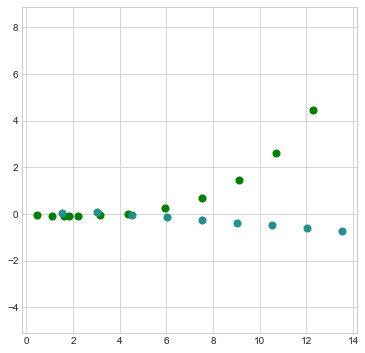

In [1408]:
gt = helper.get_future_for_agent(instance_token, sample_token, prediction_length, in_agent_frame=True)

traj = list(all_prediction_dict.values())[0][0][0]
pred = list(all_prediction_dict.values())[0][0][1]

draw_prediction_on_canvas(gt, [traj], [pred])

In [1409]:
np.amax(img), np.amin(img)

(255, 0)

#### Show sequence of BEV images

In [1410]:
from IPython.display import Image
import imageio

def save_gif(img_list, file_name='./test_bev/example.gif'):
    imageio.mimsave(f'{file_name}', img_list, duration=0.5)

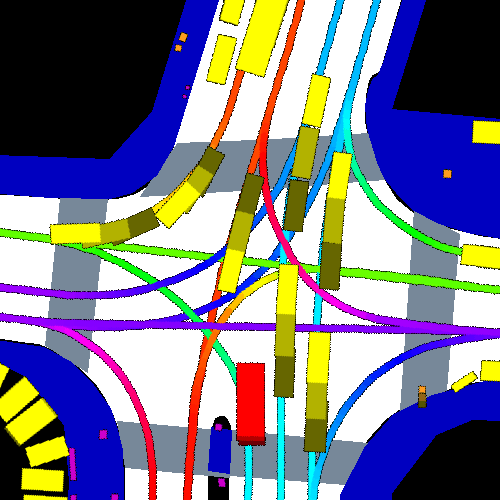

In [1411]:
Image(filename="./test_bev/example.gif", width = 250)

### Init and load model

In [1412]:
from nuscenes.prediction.models.backbone import ResNetBackbone
from nuscenes.prediction.models.mtp import MTP, MTPLoss
from nuscenes.prediction.models.covernet import CoverNet, ConstantLatticeLoss

num_modes = 415

backbone = ResNetBackbone('resnet50')

#model = MTP(backbone, num_modes=num_modes)
model = CoverNet(backbone, num_modes=num_modes)

model = torch.nn.DataParallel(model)
model = model.to(device)

In [1413]:
#model.load_state_dict(torch.load('./Models/norm_MTP_m4_e20_2.05.pth'))
#model.load_state_dict(torch.load('./almst_norm_MTP_m8_e24_2.38.pth'))

model.load_state_dict(torch.load('./best_models/CoverNet_m415_e5_3.43.pth'))

model.eval()

DataParallel(
  (module): CoverNet(
    (backbone): ResNetBackbone(
      (backbone): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (4): Sequential(
          (0): Bottleneck(
            (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_run

### Look at some predictions

In [1414]:
def get_input_tensor(instance_token, sample_token):
    
    img = generate_input_representation(instance_token, sample_token)
    img = img.astype(float) / 255.0
    
    image_tensor = torch.Tensor(img).permute(2, 0, 1).unsqueeze(0).to(device)
    
    vel = helper.get_velocity_for_agent(instance_token, sample_token)
    vel = vel / 26
    
    accel = helper.get_acceleration_for_agent(instance_token, sample_token)
    
    if np.isnan(accel): 
        accel = -1
    else:
        accel = (accel + 26) / (26 * 2)
    
    heading_cr = helper.get_heading_change_rate_for_agent(instance_token, sample_token)
    heading_cr = (heading_cr + 1.5) / 3
    
    state_tensor = torch.Tensor(np.array([vel, accel, heading_cr])).unsqueeze(0).to(device)
        
    return image_tensor, state_tensor

### Model prediction

In [1415]:
def get_predictions_mtp(model, image_tensor, state_tensor):
    output = model(image_tensor, state_tensor)
    output = output[0]
    
    trajectories_set = output[:len(output) - num_modes]
    trajectories_set = trajectories_set.reshape(num_modes, 12, 2)

    mode_probabilities = output[-num_modes:]
    
    sm = torch.nn.Softmax(dim=0)
    mode_probabilities = sm(mode_probabilities)
            
    sorted_logits_indexes = mode_probabilities.argsort(descending=True)
    sorted_mode_probabilities = mode_probabilities[sorted_logits_indexes]
    sorted_trajectories = trajectories_set[sorted_logits_indexes]

    sorted_mode_probabilities = sorted_mode_probabilities.cpu().detach().numpy()
    sorted_trajectories = sorted_trajectories.cpu().detach().numpy()
    
    return sorted_trajectories, sorted_mode_probabilities

In [1416]:
import pickle

# Epsilon is the amount of coverage in the set, 
# i.e. a real world trajectory is at most 8 meters from a trajectory in this set
# We released the set for epsilon = 2, 4, 8. Consult the paper for more information
# on how this set was created

PATH_TO_EPSILON_SET = "./covernet_trajectory_set/epsilon_4.pkl"
trajectories = pickle.load(open(PATH_TO_EPSILON_SET, 'rb'))
trajectories_set_np = np.array(trajectories)

In [1417]:
def get_predictions_covernet(model, image_tensor, state_tensor):
    logits = model(image_tensor, state_tensor)[0]
        
    sm = torch.nn.Softmax(dim=0)
    mode_probabilities = sm(logits)
        
    sorted_probabilities_indexes = mode_probabilities.argsort(descending=True)
        
    sorted_probabilities = mode_probabilities[sorted_probabilities_indexes]
    sorted_probabilities = sorted_probabilities.cpu().detach().numpy()
    
    sorted_probabilities_indexes = sorted_probabilities_indexes.cpu().detach().numpy()
    sorted_trajectories = trajectories_set_np[sorted_probabilities_indexes]
    
    return sorted_trajectories, sorted_probabilities

### Physics-based prediction

In [1451]:
from nuscenes.prediction.models.physics import ConstantVelocityHeading, PhysicsOracle

cv_model = ConstantVelocityHeading(sec_from_now=6, helper=helper)
physics_oracle = PhysicsOracle(sec_from_now=6, helper=helper)

In [1432]:
def get_scene_representation_sequence(model, target_instance_token, start_prediction_sample_token,
                                      prediction_length, amount_of_trajectories=3,
                                      render_annotation=False, render_path_on_canvas=False, render_bev=True):

    current_sample_token = start_prediction_sample_token

    images_to_gif = []

    for i in range(prediction_length * 2):
        current_sample = nusc.get('sample', current_sample_token)

        if render_annotation:
            # TODO: Get camera's views
            annotation = helper.get_sample_annotation(instance_token, current_sample_token)        
            nusc.render_annotation(annotation['token'])
        
        # Get prediction
        
        img_tensor, state_tensor = get_input_tensor(instance_token, current_sample_token)        
        
        inference_start_time = time.time()
        sorted_trajectories, mode_probabilities = get_predictions_covernet(model, img_tensor, state_tensor)
        
        sorted_trajectories = sorted_trajectories[:amount_of_trajectories]
        mode_probabilities = mode_probabilities[:amount_of_trajectories]
        
        print(f'mode prob: {mode_probabilities}')
        print(f'inf time: {round(time.time() - inference_start_time, 3)}')
        
            
        # Draw on canvas
        if render_path_on_canvas:
            gt = helper.get_future_for_agent(instance_token, current_sample_token, 6, in_agent_frame=True)
            if len(gt) > 0:
                draw_prediction_on_canvas(gt, sorted_trajectories, mode_probabilities)
        
        # Draw on BEY
        trajectories_with_probability = list(zip(sorted_trajectories, mode_probabilities))
        all_prediction_dict = {instance_token: trajectories_with_probability}
        img = generate_scene_visualization(target_instance_token, current_sample_token, all_prediction_dict)
        
        if render_bev:
            show_img(img)

        images_to_gif.append(img)
        
        current_sample_token = current_sample['next']

        if current_sample_token == '':
            break

    file_name = f'./test_bev/{target_instance_token}_{start_prediction_sample_token}.gif'
    save_gif(images_to_gif, file_name)
    return file_name

mode prob: [0.14945556 0.12742206 0.07491636]
inf time: 0.03


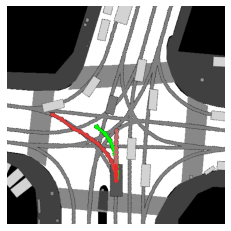

mode prob: [0.19212823 0.09791578 0.07068989]
inf time: 0.024


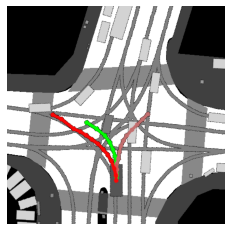

mode prob: [0.15908012 0.06192542 0.05954007]
inf time: 0.035


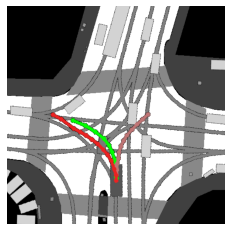

mode prob: [0.19827563 0.08807877 0.07395178]
inf time: 0.018


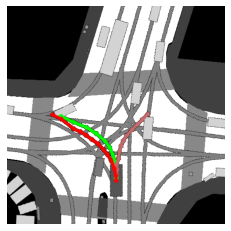

mode prob: [0.12566908 0.09529753 0.07922288]
inf time: 0.018


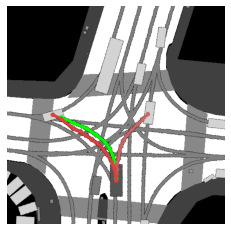

mode prob: [0.05105471 0.04778089 0.04624751]
inf time: 0.048


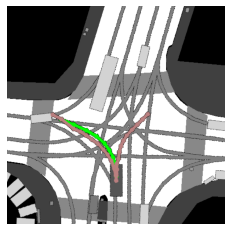

mode prob: [0.25646368 0.06563792 0.06398565]
inf time: 0.032


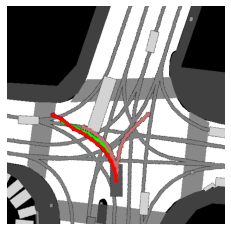

mode prob: [0.25381535 0.09379806 0.0606778 ]
inf time: 0.026


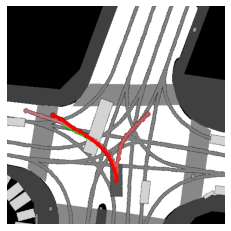

mode prob: [0.27417672 0.1037311  0.06477815]
inf time: 0.018


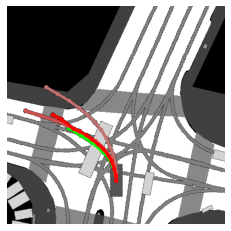

mode prob: [0.20141257 0.13498403 0.11418776]
inf time: 0.018


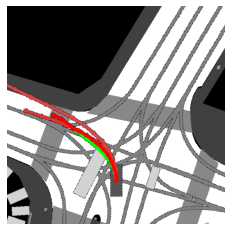

mode prob: [0.16663727 0.1264829  0.12292636]
inf time: 0.027


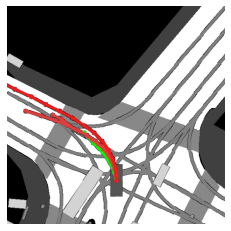

mode prob: [0.15346523 0.0968381  0.08954564]
inf time: 0.025


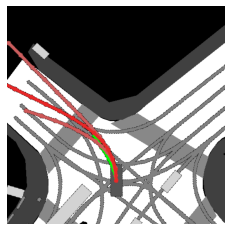

In [1433]:
instance_token, sample_token = train[50].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 6, 3)

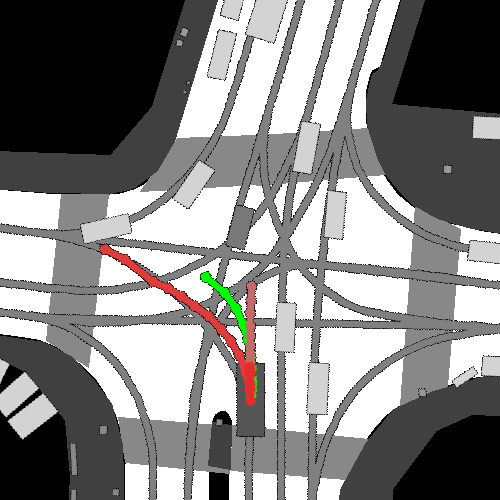

In [1422]:
Image(filename=file_name, width = 300)

mode prob: [0.1658022  0.10668341 0.08163977 0.06055461]
inf time: 0.023


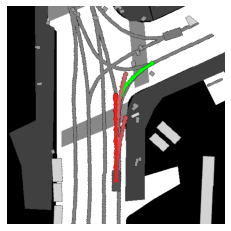

mode prob: [0.19531581 0.08555052 0.08529502 0.06142069]
inf time: 0.018


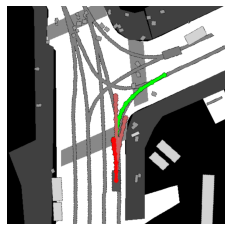

mode prob: [0.06722858 0.04540339 0.0340578  0.03252685]
inf time: 0.029


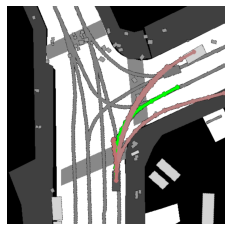

mode prob: [0.09304377 0.05476127 0.03628188 0.033076  ]
inf time: 0.023


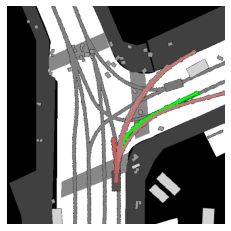

mode prob: [0.04496419 0.04185045 0.0349015  0.0281044 ]
inf time: 0.04


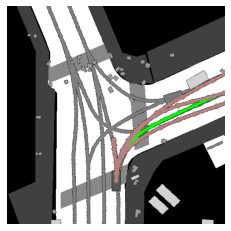

mode prob: [0.07229155 0.04721925 0.03800211 0.03395643]
inf time: 0.021


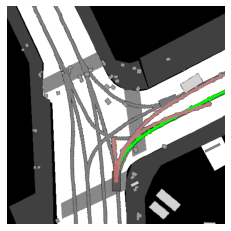

mode prob: [0.14260764 0.06519476 0.04404022 0.04338426]
inf time: 0.017


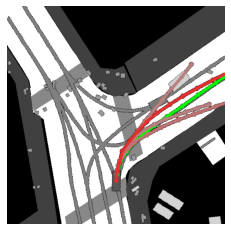

mode prob: [0.12845683 0.06045609 0.04537496 0.04381564]
inf time: 0.033


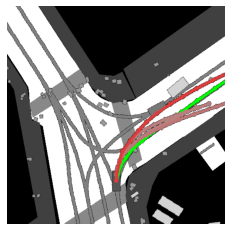

mode prob: [0.16329974 0.07592972 0.04397763 0.0428444 ]
inf time: 0.037


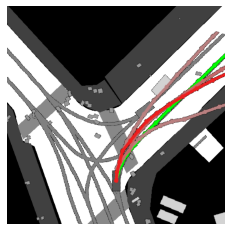

mode prob: [0.125251   0.08853085 0.07221027 0.04342674]
inf time: 0.043


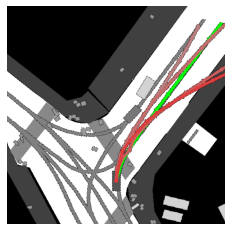

mode prob: [0.08032647 0.08022784 0.07453007 0.06828121]
inf time: 0.033


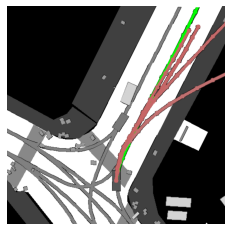

mode prob: [0.09692692 0.09386    0.06360215 0.0447355 ]
inf time: 0.037


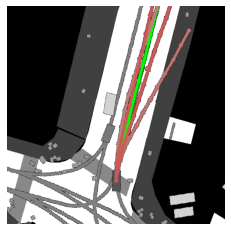

mode prob: [0.09807539 0.08154698 0.06064023 0.04699989]
inf time: 0.019


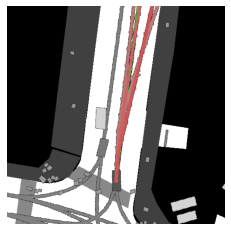

mode prob: [0.08453766 0.07450842 0.06206018 0.05108041]
inf time: 0.038


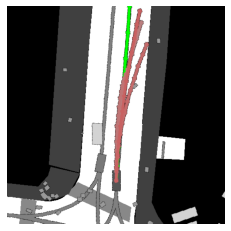

mode prob: [0.1730669  0.12271194 0.09215725 0.09114725]
inf time: 0.034


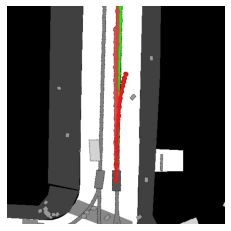

mode prob: [0.14709893 0.13122733 0.09377121 0.06837367]
inf time: 0.018


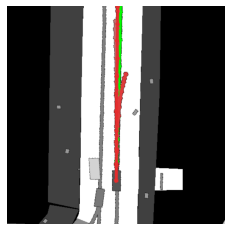

mode prob: [0.11592162 0.11410064 0.09369045 0.06901491]
inf time: 0.031


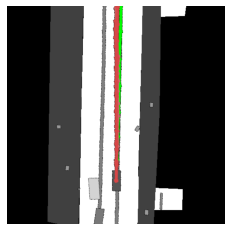

mode prob: [0.11917095 0.08937568 0.0853209  0.08438978]
inf time: 0.024


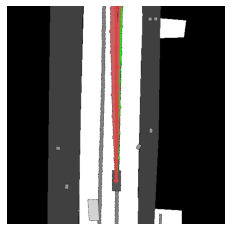

mode prob: [0.1419097  0.1133934  0.08346829 0.07504555]
inf time: 0.018


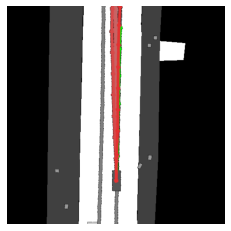

mode prob: [0.18092161 0.11327485 0.10192844 0.06880113]
inf time: 0.018


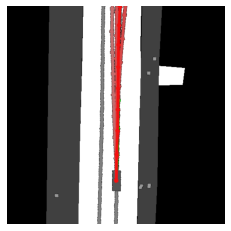

In [1434]:
instance_token, sample_token = train[740].split("_")

file_name = get_scene_representation_sequence(model, instance_token, 'ef316fb422c24907bc01dd789c2c87b6', 10, amount_of_trajectories=4)

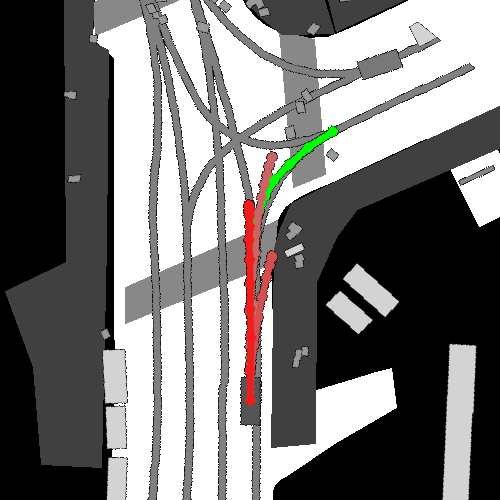

In [1425]:
Image(filename=file_name, width = 300)

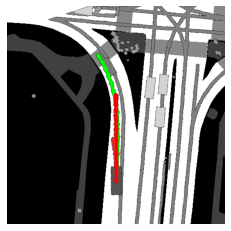

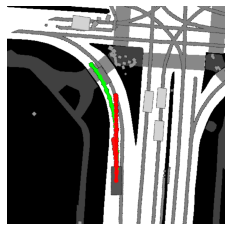

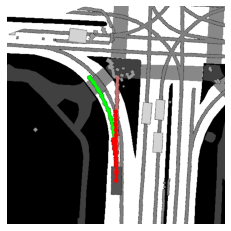

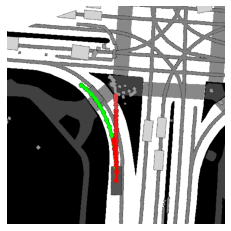

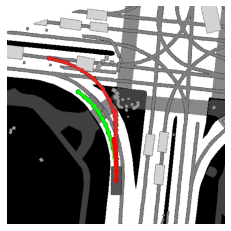

...

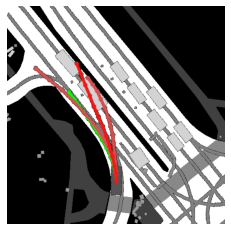

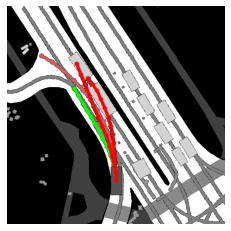

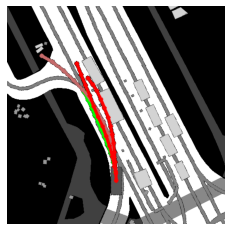

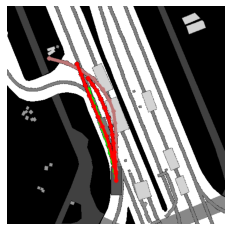

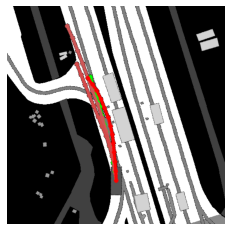

In [1426]:
instance_token, sample_token = test[190].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 10)

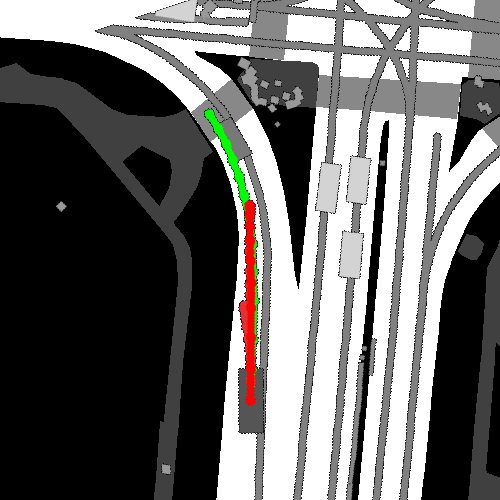

In [1427]:
Image(filename=file_name, width = 300)

mode prob: [0.33910385 0.13593823 0.08395322]
inf time: 0.018


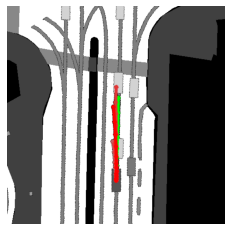

mode prob: [0.23439099 0.14641127 0.1047934 ]
inf time: 0.02


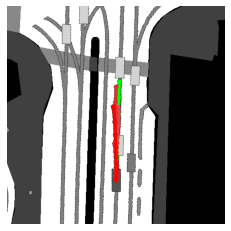

mode prob: [0.11960011 0.10920214 0.09278809]
inf time: 0.017


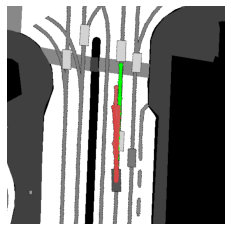

mode prob: [0.1503061  0.14672737 0.09706534]
inf time: 0.018


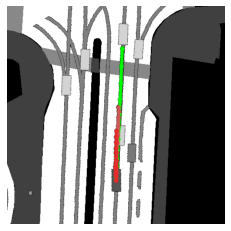

mode prob: [0.11516445 0.10187279 0.08763488]
inf time: 0.018


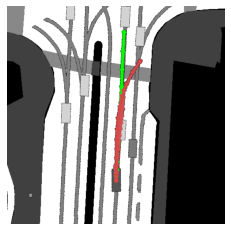

mode prob: [0.1117456  0.08559246 0.07812007]
inf time: 0.018


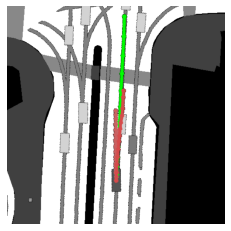

mode prob: [0.17169848 0.16193672 0.12103613]
inf time: 0.018


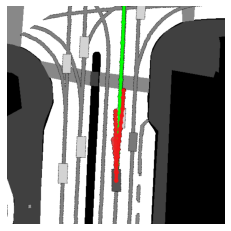

mode prob: [0.15915434 0.15599945 0.13480674]
inf time: 0.035


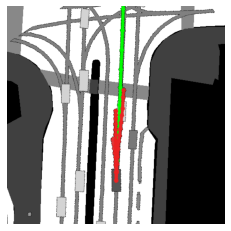

mode prob: [0.14762388 0.1368428  0.13053408]
inf time: 0.029


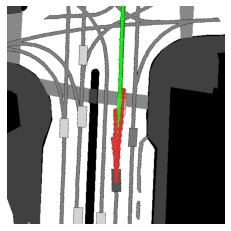

mode prob: [0.10652563 0.07758071 0.07521774]
inf time: 0.018


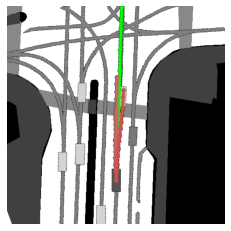

mode prob: [0.17478025 0.12823774 0.07143757]
inf time: 0.018


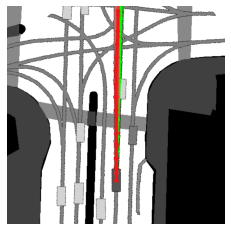

mode prob: [0.19657987 0.12550302 0.11500233]
inf time: 0.034


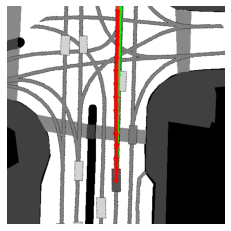

mode prob: [0.150426   0.12004858 0.11214647]
inf time: 0.028


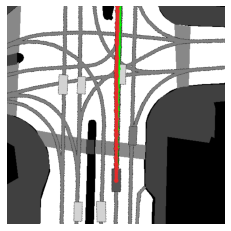

mode prob: [0.09694646 0.07609065 0.06668601]
inf time: 0.02


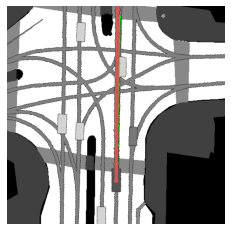

mode prob: [0.1972374  0.12582593 0.08164866]
inf time: 0.027


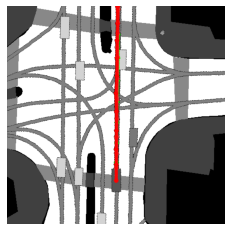

mode prob: [0.19024453 0.13458306 0.10157508]
inf time: 0.032


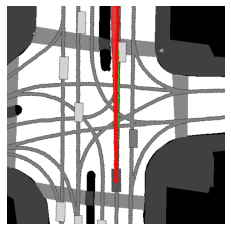

mode prob: [0.18887101 0.15162206 0.14446928]
inf time: 0.017


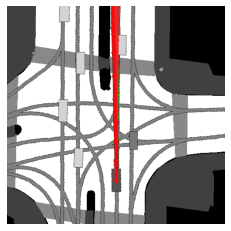

mode prob: [0.34679297 0.10315701 0.08506853]
inf time: 0.019


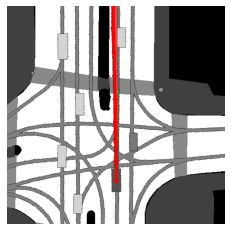

mode prob: [0.23767029 0.20109066 0.15002212]
inf time: 0.018


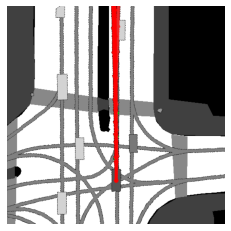

mode prob: [0.21605031 0.19908722 0.17239314]
inf time: 0.018


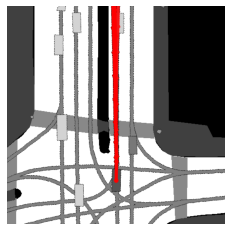

In [1435]:
instance_token, sample_token = test[590].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 10)

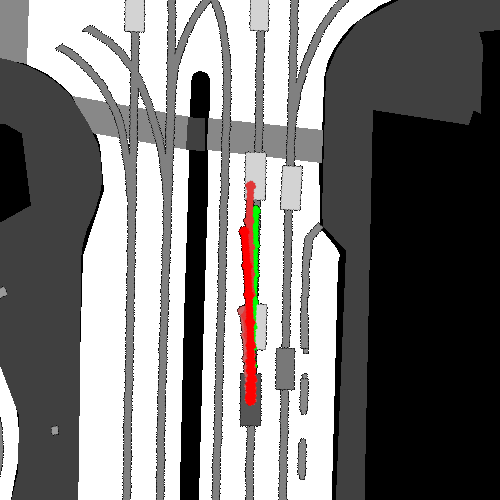

In [1436]:
Image(filename=file_name, width = 200)

mode prob: [0.17754783 0.11269286 0.05611931]
inf time: 0.021


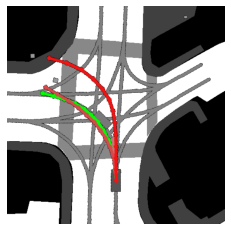

mode prob: [0.1562261  0.1496309  0.06417131]
inf time: 0.018


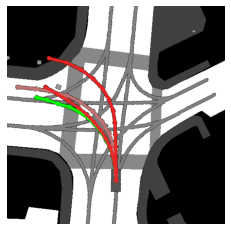

mode prob: [0.12975939 0.11994323 0.09990644]
inf time: 0.017


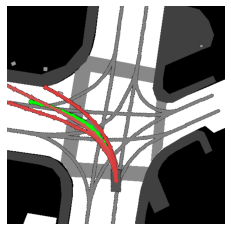

mode prob: [0.12703504 0.11430646 0.10829036]
inf time: 0.018


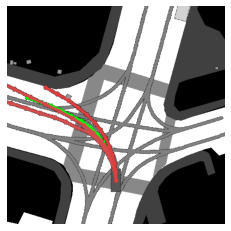

mode prob: [0.1533536  0.09416925 0.09008485]
inf time: 0.027


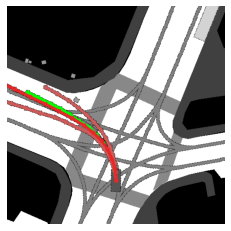

mode prob: [0.1832551  0.09124501 0.07958937]
inf time: 0.03


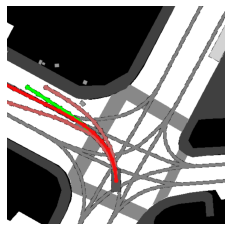

mode prob: [0.1378541  0.11829048 0.09072632]
inf time: 0.028


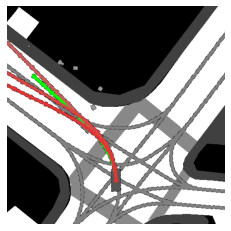

mode prob: [0.15677433 0.10616846 0.09416404]
inf time: 0.021


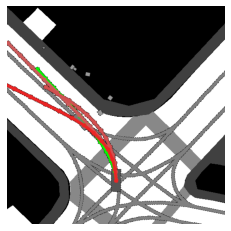

mode prob: [0.13924488 0.07689068 0.07343328]
inf time: 0.023


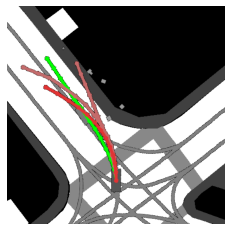

mode prob: [0.16088544 0.11594617 0.11267734]
inf time: 0.018


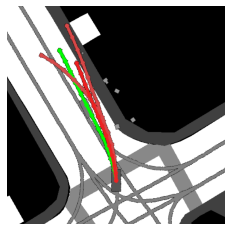

mode prob: [0.2368075  0.1115186  0.09824941]
inf time: 0.038


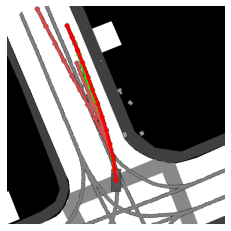

mode prob: [0.55754924 0.07032523 0.04978134]
inf time: 0.028


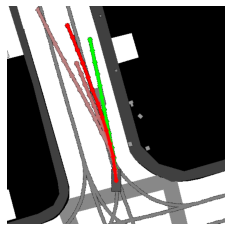

mode prob: [0.12742332 0.1048407  0.08857069]
inf time: 0.038


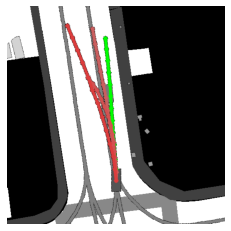

mode prob: [0.28638408 0.13123778 0.10335248]
inf time: 0.018


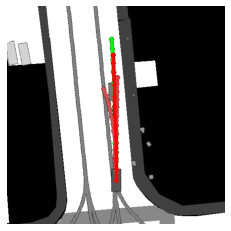

mode prob: [0.1875045  0.15644181 0.14703253]
inf time: 0.04


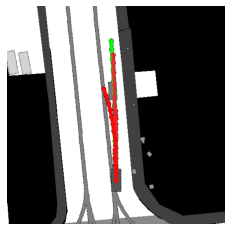

mode prob: [0.17929411 0.1144461  0.11360769]
inf time: 0.018


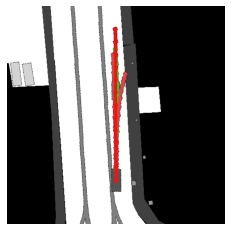

mode prob: [0.34794363 0.15529151 0.13242872]
inf time: 0.017


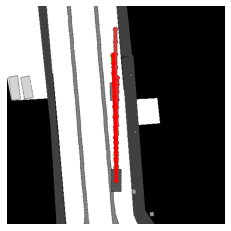

mode prob: [0.30340296 0.23428312 0.10890877]
inf time: 0.019


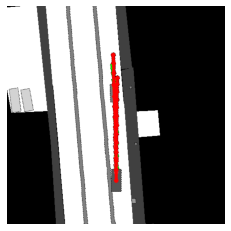

mode prob: [0.3547689  0.22393438 0.08153386]
inf time: 0.022


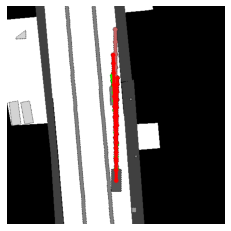

mode prob: [0.24332155 0.21994506 0.13554421]
inf time: 0.019


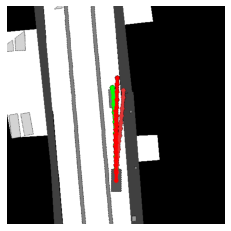

In [1437]:
instance_token, sample_token = test[1938].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 10)

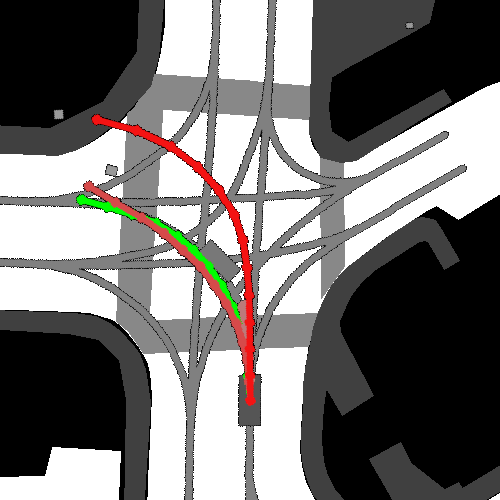

In [1440]:
Image(filename=file_name, width = 200)

mode prob: [0.07740434 0.06670314 0.06620581]
inf time: 0.03


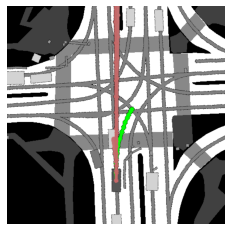

mode prob: [0.19329299 0.1524496  0.11428519]
inf time: 0.022


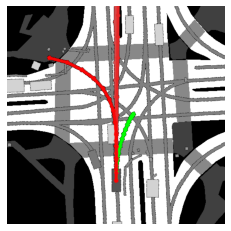

mode prob: [0.16626336 0.13542566 0.06530086]
inf time: 0.024


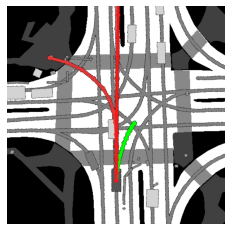

mode prob: [0.2152723  0.07811807 0.05214203]
inf time: 0.035


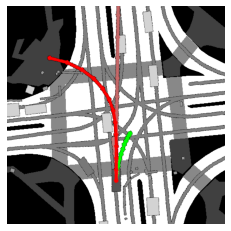

mode prob: [0.14729376 0.12179966 0.04481934]
inf time: 0.018


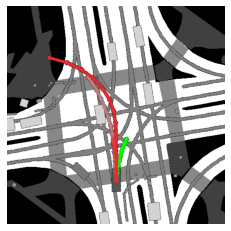

mode prob: [0.04349384 0.0414542  0.03200783]
inf time: 0.021


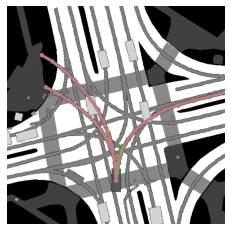

mode prob: [0.06220637 0.04368876 0.04013556]
inf time: 0.017


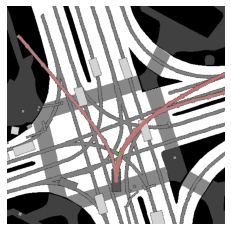

mode prob: [0.0819988  0.05074059 0.04340458]
inf time: 0.028


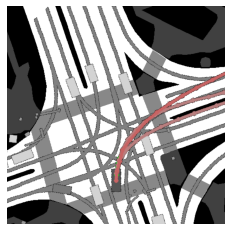

mode prob: [0.07029832 0.05290061 0.04618643]
inf time: 0.024


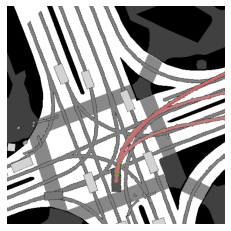

mode prob: [0.07925659 0.0671613  0.04559922]
inf time: 0.021


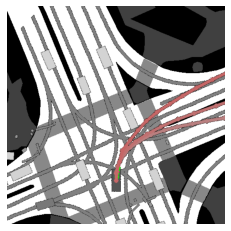

mode prob: [0.07576006 0.06835037 0.05609813]
inf time: 0.017


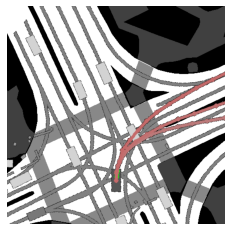

mode prob: [0.09421276 0.07639469 0.05086895]
inf time: 0.017


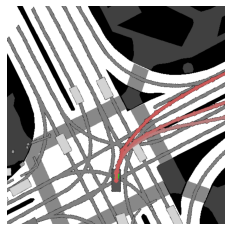

In [1441]:
instance_token, sample_token = valid[20].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 6)

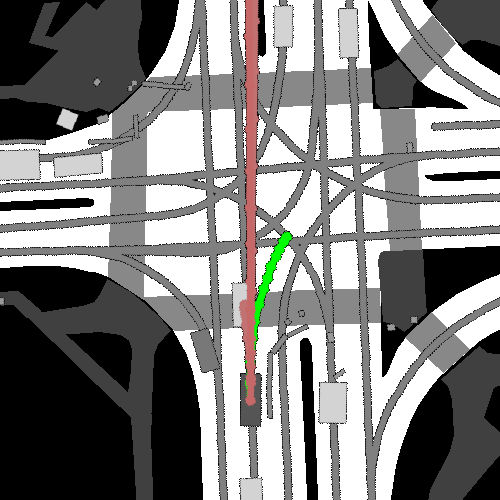

In [1442]:
Image(filename=file_name, width = 200)

mode prob: [0.16035785 0.1585528  0.12255334]
inf time: 0.025


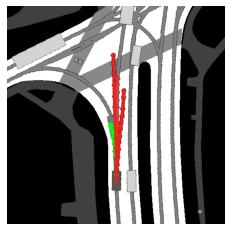

mode prob: [0.14201514 0.10511594 0.10374697]
inf time: 0.02


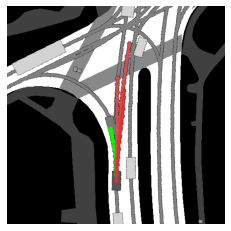

mode prob: [0.10579142 0.08461014 0.08025327]
inf time: 0.023


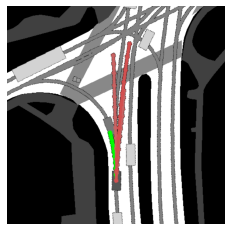

mode prob: [0.10380625 0.10032645 0.0771111 ]
inf time: 0.025


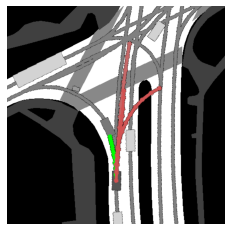

mode prob: [0.12786715 0.08982387 0.0768481 ]
inf time: 0.023


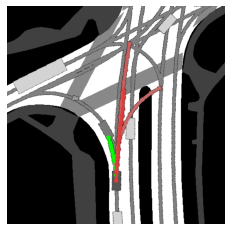

mode prob: [0.11724913 0.09874269 0.08991577]
inf time: 0.036


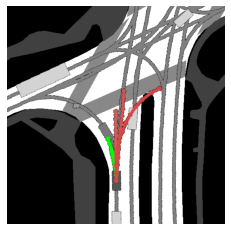

mode prob: [0.13472499 0.10906775 0.08807817]
inf time: 0.035


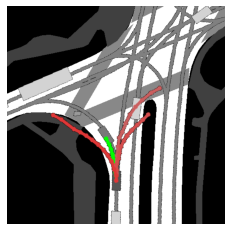

mode prob: [0.14735115 0.14578156 0.10224125]
inf time: 0.026


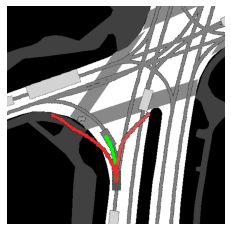

mode prob: [0.21653856 0.15975688 0.08966634]
inf time: 0.026


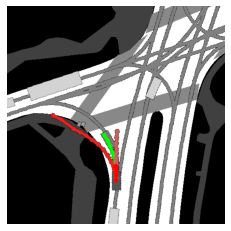

mode prob: [0.48928156 0.13709658 0.06632831]
inf time: 0.019


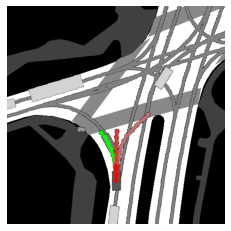

mode prob: [0.41126212 0.11903615 0.07493999]
inf time: 0.039


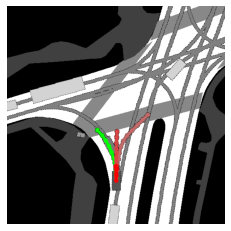

mode prob: [0.41899842 0.11963278 0.07557629]
inf time: 0.028


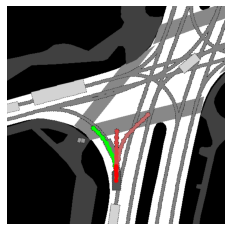

mode prob: [0.3499235  0.09090909 0.07058641]
inf time: 0.025


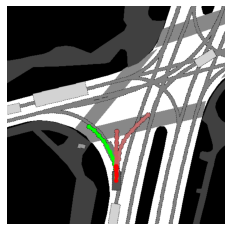

mode prob: [0.23983864 0.0873447  0.07058416]
inf time: 0.02


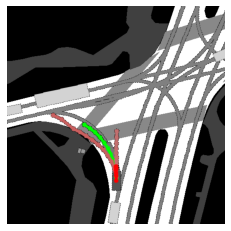

mode prob: [0.23757686 0.09778976 0.08731205]
inf time: 0.039


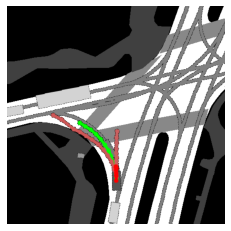

mode prob: [0.19682273 0.12397181 0.10260382]
inf time: 0.027


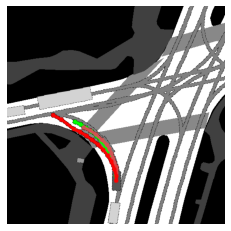

mode prob: [0.29866013 0.08917175 0.0790128 ]
inf time: 0.018


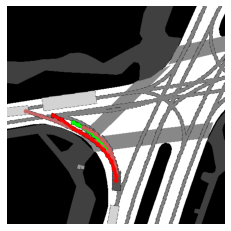

mode prob: [0.25784072 0.13251977 0.08625791]
inf time: 0.027


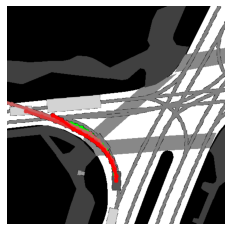

mode prob: [0.30108184 0.17027493 0.1024925 ]
inf time: 0.018


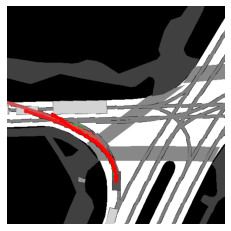

mode prob: [0.26438966 0.1903249  0.12955168]
inf time: 0.018


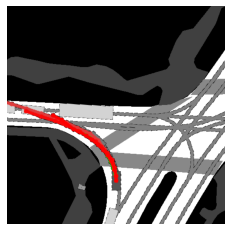

mode prob: [0.14642851 0.14356606 0.14186396]
inf time: 0.018


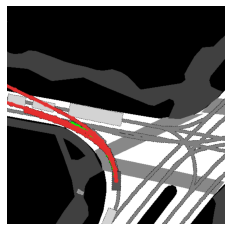

mode prob: [0.1386751 0.1334938 0.1318809]
inf time: 0.018


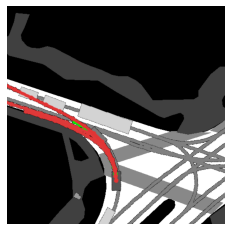

mode prob: [0.14765307 0.14228109 0.11639217]
inf time: 0.017


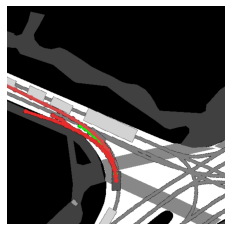

mode prob: [0.12861617 0.12728147 0.11547183]
inf time: 0.039


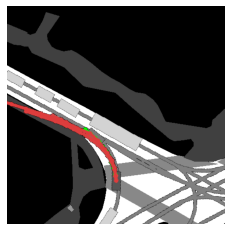

mode prob: [0.12026604 0.11397129 0.10912522]
inf time: 0.018


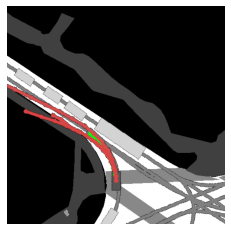

mode prob: [0.21688364 0.13779683 0.07346387]
inf time: 0.018


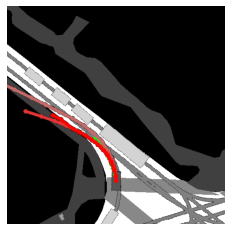

mode prob: [0.16781552 0.09839445 0.07233699]
inf time: 0.018


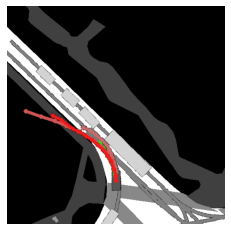

mode prob: [0.11793347 0.07875628 0.07149971]
inf time: 0.018


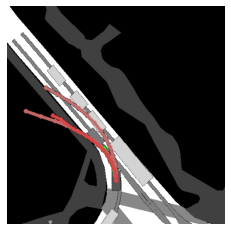

mode prob: [0.09226053 0.085408   0.07413603]
inf time: 0.022


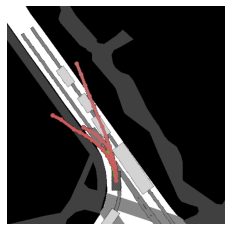

mode prob: [0.17871644 0.06737398 0.04442499]
inf time: 0.018


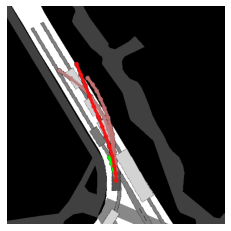

mode prob: [0.27703714 0.13231684 0.10153793]
inf time: 0.032


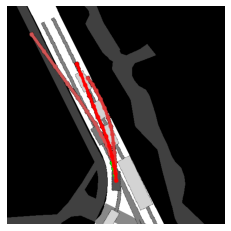

mode prob: [0.29375628 0.15612736 0.071091  ]
inf time: 0.021


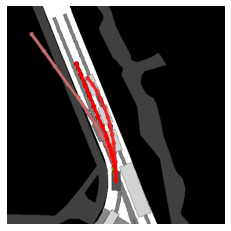

In [1443]:
instance_token, sample_token = test[1333].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 16, 3)

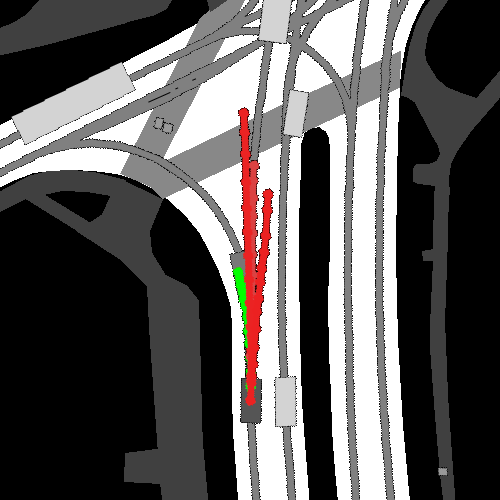

In [1444]:
Image(filename=file_name, width = 200)

mode prob: [0.15677771 0.11603683 0.06405652]
inf time: 0.034


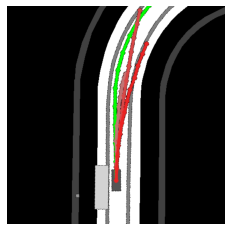

mode prob: [0.06149264 0.059126   0.05032627]
inf time: 0.028


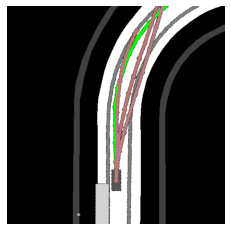

mode prob: [0.06652523 0.06401916 0.04434802]
inf time: 0.027


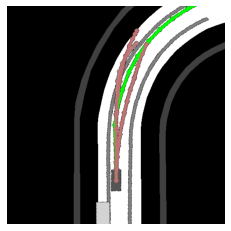

mode prob: [0.08007456 0.05580006 0.05086166]
inf time: 0.028


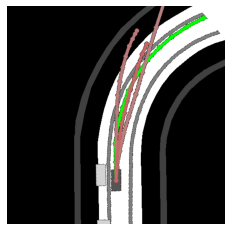

mode prob: [0.07556908 0.06642099 0.06481005]
inf time: 0.028


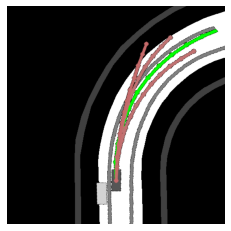

mode prob: [0.07984705 0.05011008 0.04911004]
inf time: 0.028


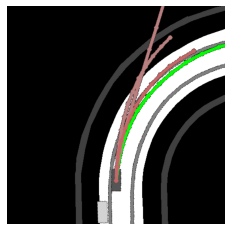

mode prob: [0.07116036 0.04977586 0.04822432]
inf time: 0.021


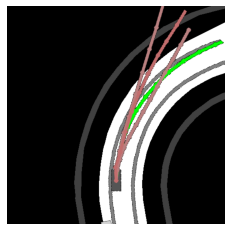

mode prob: [0.06272074 0.04531268 0.04005262]
inf time: 0.018


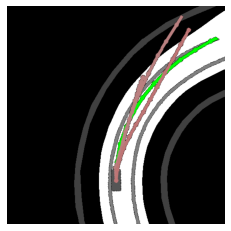

mode prob: [0.06496761 0.04088413 0.03981733]
inf time: 0.018


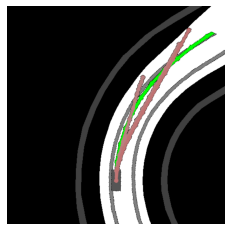

mode prob: [0.05720244 0.04495703 0.04423319]
inf time: 0.025


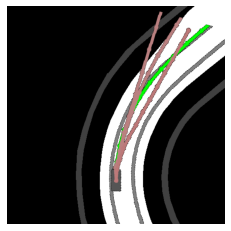

mode prob: [0.05436115 0.05268393 0.05060646]
inf time: 0.018


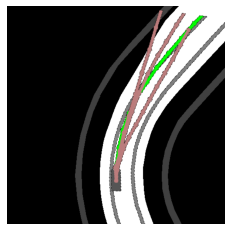

mode prob: [0.06136429 0.0531645  0.04959394]
inf time: 0.018


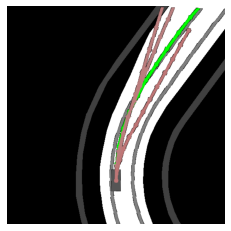

mode prob: [0.05904184 0.05332476 0.05297557]
inf time: 0.025


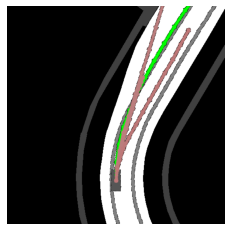

mode prob: [0.09469341 0.08547919 0.06841592]
inf time: 0.027


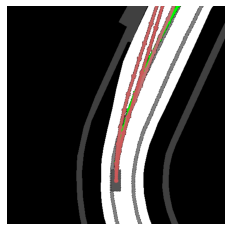

mode prob: [0.1333289  0.11121996 0.10727847]
inf time: 0.018


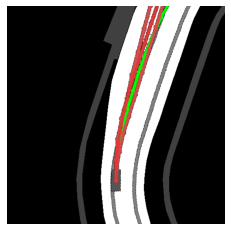

mode prob: [0.18110584 0.11725865 0.06824706]
inf time: 0.031


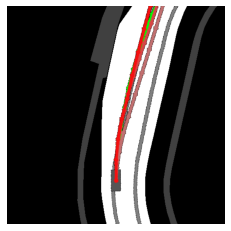

mode prob: [0.07879435 0.07390525 0.06955838]
inf time: 0.027


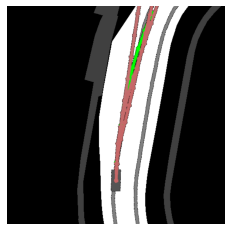

mode prob: [0.0738709  0.06678389 0.06657707]
inf time: 0.029


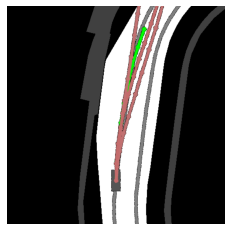

mode prob: [0.09052663 0.06396335 0.05939924]
inf time: 0.033


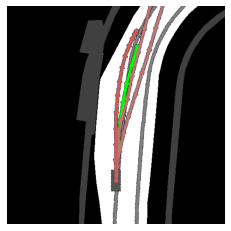

mode prob: [0.08460189 0.05778246 0.0561309 ]
inf time: 0.027


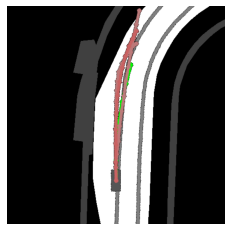

mode prob: [0.11879135 0.06237758 0.05131561]
inf time: 0.021


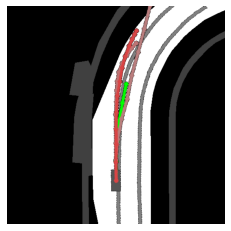

mode prob: [0.06556819 0.05449253 0.05104543]
inf time: 0.028


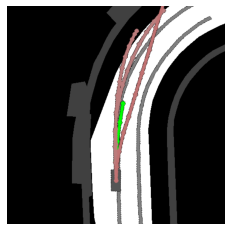

mode prob: [0.07261837 0.05190247 0.05060954]
inf time: 0.023


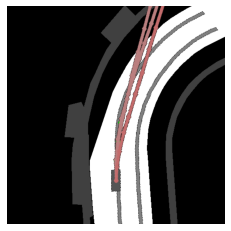

mode prob: [0.067579   0.05180885 0.04728371]
inf time: 0.038


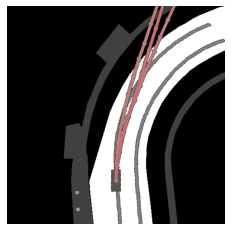

mode prob: [0.07234106 0.05784645 0.05256519]
inf time: 0.039


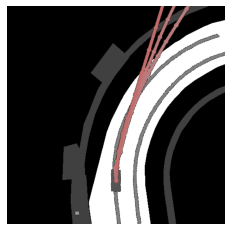

mode prob: [0.05967602 0.05692423 0.05515732]
inf time: 0.018


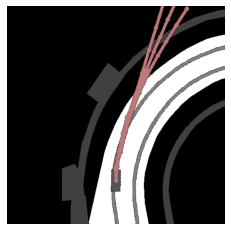

In [1445]:
instance_token, sample_token = test[262].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 14)

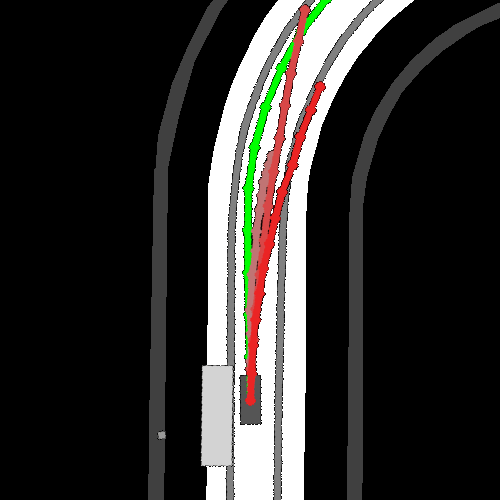

In [1446]:
Image(filename=file_name, width = 200)

mode prob: [0.29208538 0.25967613 0.14773238 0.07771905 0.07017589 0.05062414]
inf time: 0.037


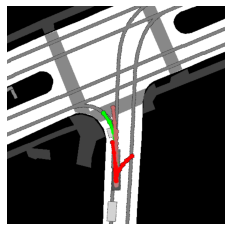

mode prob: [0.31644797 0.25931144 0.1282916  0.08802804 0.07012162 0.04847349]
inf time: 0.027


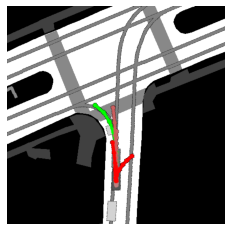

mode prob: [0.29800147 0.24375626 0.13074212 0.08692188 0.07826615 0.04980209]
inf time: 0.035


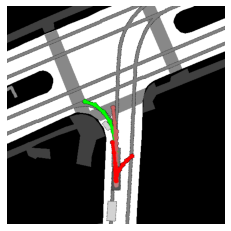

mode prob: [0.29810393 0.25454214 0.15248299 0.0773868  0.0761     0.04799472]
inf time: 0.04


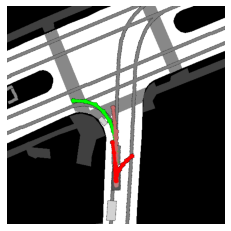

mode prob: [0.27098528 0.22509262 0.1939389  0.09908769 0.07315521 0.03918622]
inf time: 0.038


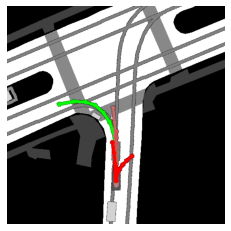

mode prob: [0.3987993  0.32541278 0.09920436 0.06022623 0.04465088 0.02382668]
inf time: 0.018


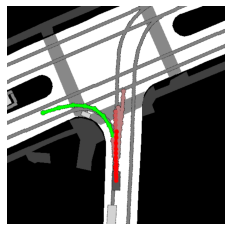

mode prob: [0.2574982  0.22170517 0.21188217 0.18464185 0.06000626 0.01425241]
inf time: 0.018


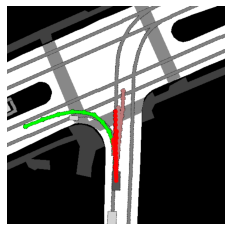

mode prob: [0.36625206 0.2713387  0.12066831 0.08101537 0.05015578 0.02933609]
inf time: 0.031


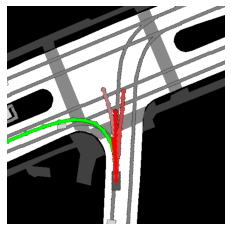

mode prob: [0.26333556 0.19007386 0.18367404 0.06056124 0.04603102 0.04484013]
inf time: 0.021


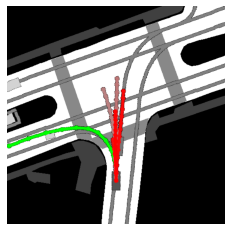

mode prob: [0.18551321 0.17610818 0.14001067 0.06331    0.06146093 0.0390054 ]
inf time: 0.018


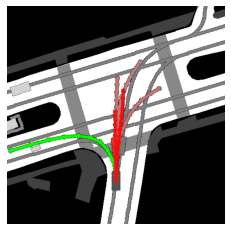

mode prob: [0.09638127 0.09376952 0.09348858 0.09238803 0.08939118 0.04733224]
inf time: 0.025


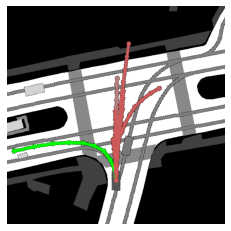

mode prob: [0.0500224  0.04916378 0.03852146 0.03681563 0.03409696 0.03333016]
inf time: 0.028


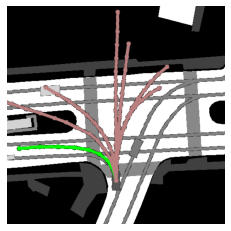

mode prob: [0.10385976 0.06778612 0.05843247 0.05083107 0.04514363 0.04407842]
inf time: 0.028


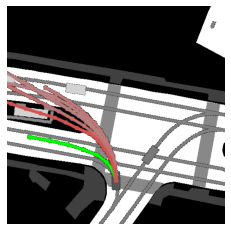

mode prob: [0.10985069 0.10875259 0.0686959  0.06475326 0.05458878 0.05446988]
inf time: 0.018


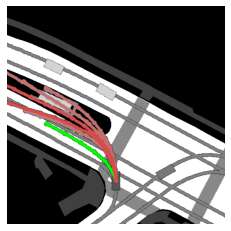

mode prob: [0.08587949 0.05511064 0.05282204 0.04863175 0.03848512 0.03657838]
inf time: 0.027


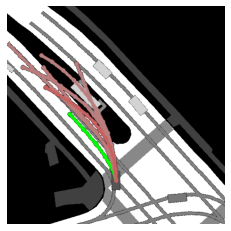

mode prob: [0.11031741 0.07245988 0.05692903 0.04626302 0.04330165 0.03621783]
inf time: 0.035


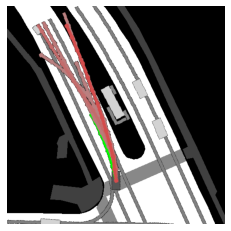

mode prob: [0.25880986 0.06633825 0.05954936 0.04653928 0.04070413 0.03551159]
inf time: 0.034


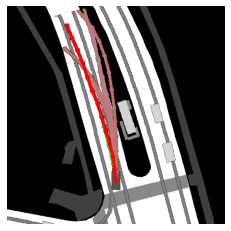

mode prob: [0.19308802 0.08649275 0.08438066 0.07871281 0.06320793 0.05771276]
inf time: 0.018


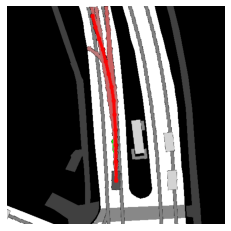

In [1447]:
instance_token, sample_token = valid[480].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 9, 6)

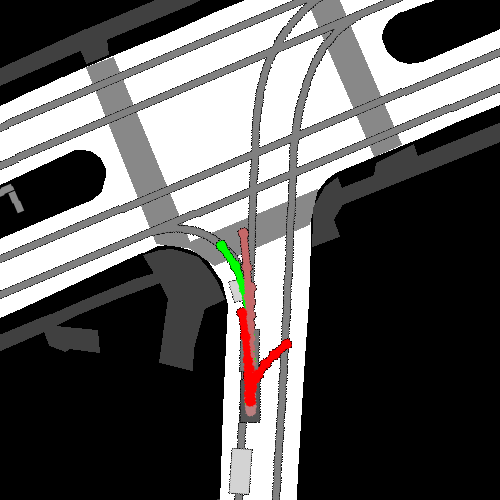

In [1448]:
Image(filename=file_name, width = 200)

mode prob: [0.24030158 0.21242093 0.14259352 0.12314936 0.03688246 0.0311505 ]
inf time: 0.034


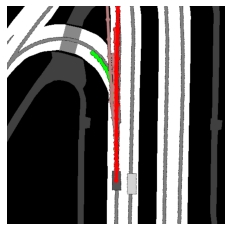

mode prob: [0.24881817 0.13399602 0.11971422 0.11040997 0.07948994 0.04059471]
inf time: 0.039


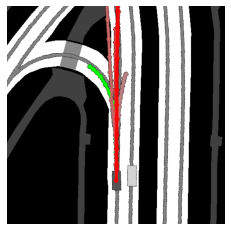

mode prob: [0.192926   0.13339692 0.12232462 0.08762244 0.06781835 0.04455913]
inf time: 0.024


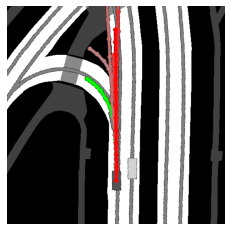

mode prob: [0.17900902 0.11074403 0.06690958 0.06031266 0.04465967 0.04111078]
inf time: 0.018


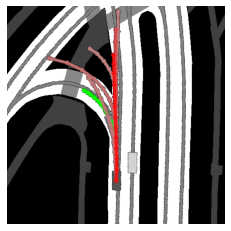

mode prob: [0.14774473 0.13427001 0.09601247 0.08644177 0.0456218  0.04019177]
inf time: 0.017


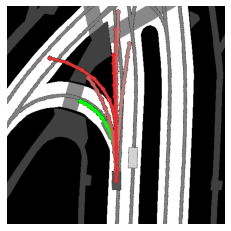

mode prob: [0.0727922  0.06818216 0.05912458 0.05679994 0.04782923 0.04270229]
inf time: 0.022


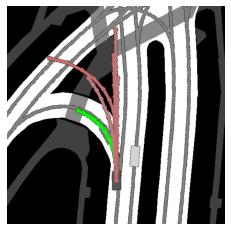

mode prob: [0.04670408 0.04167577 0.02951778 0.02455816 0.02455626 0.02330815]
inf time: 0.018


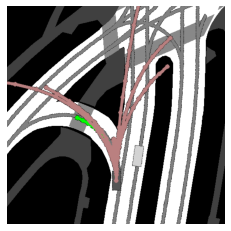

mode prob: [0.07167852 0.06118413 0.04419763 0.03433405 0.03330354 0.02996066]
inf time: 0.034


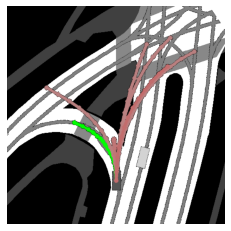

mode prob: [0.07500514 0.0604072  0.05834495 0.04953134 0.04612207 0.03425349]
inf time: 0.018


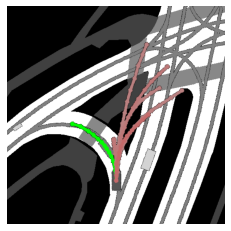

mode prob: [0.13745868 0.08908413 0.08658561 0.06317317 0.05432953 0.02840905]
inf time: 0.027


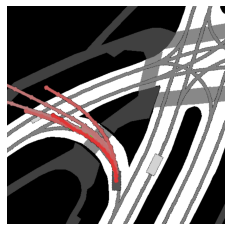

mode prob: [0.15489839 0.1167706  0.09281173 0.09215547 0.09177173 0.02551648]
inf time: 0.027


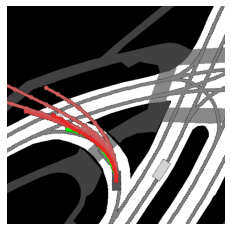

mode prob: [0.30562824 0.12586665 0.06750265 0.05799529 0.04021499 0.02730923]
inf time: 0.035


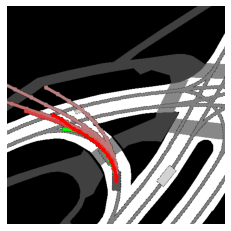

mode prob: [0.2740603  0.11632265 0.07363524 0.06117095 0.04768218 0.03686266]
inf time: 0.018


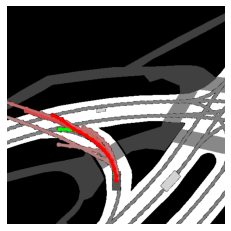

mode prob: [0.26252696 0.10944272 0.06662326 0.062804   0.04917378 0.04023974]
inf time: 0.024


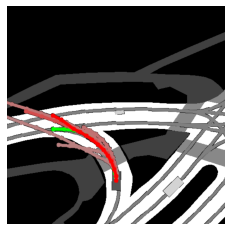

mode prob: [0.12258907 0.07152151 0.07044331 0.05544807 0.05453169 0.04916202]
inf time: 0.018


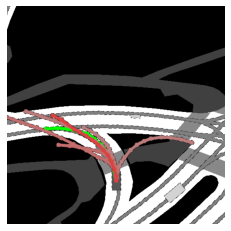

mode prob: [0.17964229 0.07449311 0.06922628 0.06590433 0.06232374 0.04360951]
inf time: 0.03


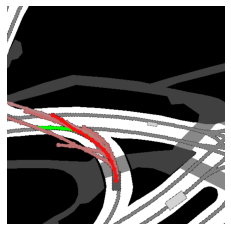

mode prob: [0.26246673 0.0890358  0.07932213 0.05832873 0.05186767 0.03928062]
inf time: 0.025


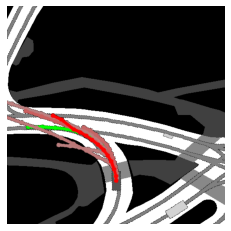

mode prob: [0.25672764 0.09891375 0.07215001 0.04322717 0.02700862 0.02578638]
inf time: 0.018


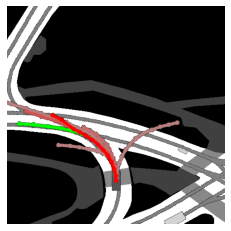

In [1449]:
instance_token, sample_token = valid[710].split("_")

file_name = get_scene_representation_sequence(model, instance_token, sample_token, 9, 6)

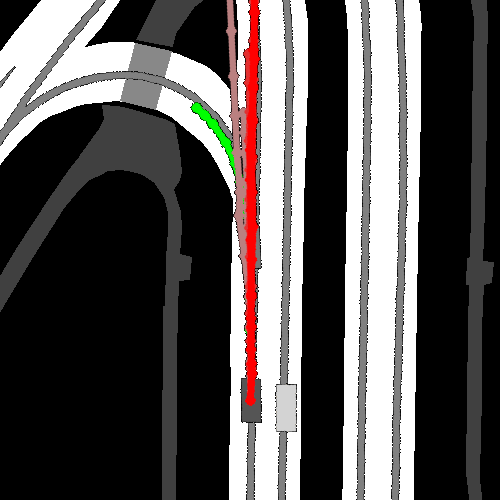

In [1450]:
Image(filename=file_name, width = 200)

### Convert model to ONNX-format, if result is OK

In [178]:
instance_token, current_sample_token = train[0].split("_")

img_tensor, state_tensor = get_input_tensor(instance_token, current_sample_token)   
img_tensor.shape, state_tensor.shape

Self-intersection at or near point 836.93610249425376 1482.0292367715256


(torch.Size([1, 3, 500, 500]), torch.Size([1, 3]))

In [204]:
batch_size = 1    # just a random number

# Input to the model
img_tensor = torch.randn(batch_size, 3, 500, 500, requires_grad=True).to(device)
state_tensor = torch.randn(batch_size, 3, requires_grad=True).to(device)

torch_out = model(img_tensor, state_tensor)

# Export the model
torch.onnx.export(model.module,                                 # model being run
                  (img_tensor, state_tensor),                   # model input (or a tuple for multiple inputs)
                  "./onnx_models/covernet_m415_loss_3.43.onnx", # where to save the model (can be a file or file-like object)
                  export_params=True,                           # store the trained parameter weights inside the model file
                  opset_version=10,                             # the ONNX version to export the model to
                  do_constant_folding=True,                     # whether to execute constant folding for optimization
                  input_names = ['img_input', 'state_input'],   # the model's input names
                  output_names = ['output'],                    # the model's output names
                  
                  dynamic_axes={'img_input' : {0 : 'batch_size'},    # variable length axes
                                'state_input' : {0 : 'batch_size'},
                                'output' : {0 : 'batch_size'}})

In [205]:
### Check if export is correct

import onnx
import onnxruntime

onnx_model = onnx.load("./onnx_models/covernet_m415_loss_3.43.onnx")
onnx.checker.check_model(onnx_model)

ort_session = onnxruntime.InferenceSession("./onnx_models/covernet_m415_loss_3.43.onnx")

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

# compute ONNX Runtime output prediction
ort_inputs = { ort_session.get_inputs()[0].name: to_numpy(img_tensor),
               ort_session.get_inputs()[1].name: to_numpy(state_tensor) }

ort_outs = ort_session.run(None, ort_inputs)

# compare ONNX Runtime and PyTorch results
np.testing.assert_allclose(to_numpy(torch_out), ort_outs[0], rtol=1e-03, atol=1e-05)
print("Exported model has been tested with ONNXRuntime, and the result looks good!")

Exported model has been tested with ONNXRuntime, and the result looks good!
